In [995]:
#import all the libraries at one place
#easy to execute everytime

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import linear_model
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import train_test_split,KFold,cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score
from scipy.stats import shapiro
from scipy.stats import boxcox
pd.set_option('display.max_columns',100)
pd.set_option('display.max_rows',100)
# hide warnings
import warnings
warnings.filterwarnings('ignore')

In [996]:
#import the data set
house_data = pd.read_csv("train.csv")

In [997]:
#get the datatype info
house_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
Id               1460 non-null int64
MSSubClass       1460 non-null int64
MSZoning         1460 non-null object
LotFrontage      1201 non-null float64
LotArea          1460 non-null int64
Street           1460 non-null object
Alley            91 non-null object
LotShape         1460 non-null object
LandContour      1460 non-null object
Utilities        1460 non-null object
LotConfig        1460 non-null object
LandSlope        1460 non-null object
Neighborhood     1460 non-null object
Condition1       1460 non-null object
Condition2       1460 non-null object
BldgType         1460 non-null object
HouseStyle       1460 non-null object
OverallQual      1460 non-null int64
OverallCond      1460 non-null int64
YearBuilt        1460 non-null int64
YearRemodAdd     1460 non-null int64
RoofStyle        1460 non-null object
RoofMatl         1460 non-null object
Exterior1st      1460 non-n

## observe the dataset

In [998]:
house_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [999]:
house_data.describe(percentiles=[0.05,0.1,0.25,0.5,0.75,0.9,0.95,0.99])

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
5%,73.950000,20.000000,34.000000,3311.700000,4.000000,4.000000,1916.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,519.300000,672.950000,0.000000,0.000000,848.000000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,4.000000,0.000000,1930.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,2006.000000,88000.000000
10%,146.900000,20.000000,44.000000,5000.000000,5.000000,5.000000,1924.900000,1950.000000,0.000000,0.000000,0.000000,74.900000,636.900000,756.900000,0.000000,0.000000,912.000000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1945.000000,1.000000,240.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,2006.000000,106475.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
90%,1314.100000,120.000000,96.000000,14381.700000,8.000000,7.000

## from the above description we can find that the data has lot of outliers

In [1000]:
#check for the null values
round((house_data.isnull().sum()/len(house_data.index)*100),2)


Id                0.00
MSSubClass        0.00
MSZoning          0.00
LotFrontage      17.74
LotArea           0.00
Street            0.00
Alley            93.77
LotShape          0.00
LandContour       0.00
Utilities         0.00
LotConfig         0.00
LandSlope         0.00
Neighborhood      0.00
Condition1        0.00
Condition2        0.00
BldgType          0.00
HouseStyle        0.00
OverallQual       0.00
OverallCond       0.00
YearBuilt         0.00
YearRemodAdd      0.00
RoofStyle         0.00
RoofMatl          0.00
Exterior1st       0.00
Exterior2nd       0.00
MasVnrType        0.55
MasVnrArea        0.55
ExterQual         0.00
ExterCond         0.00
Foundation        0.00
BsmtQual          2.53
BsmtCond          2.53
BsmtExposure      2.60
BsmtFinType1      2.53
BsmtFinSF1        0.00
BsmtFinType2      2.60
BsmtFinSF2        0.00
BsmtUnfSF         0.00
TotalBsmtSF       0.00
Heating           0.00
HeatingQC         0.00
CentralAir        0.00
Electrical        0.07
1stFlrSF   

# data Cleaning

## lotfrontage has lot of null values

In [1001]:
#check for it's relation with saleprice

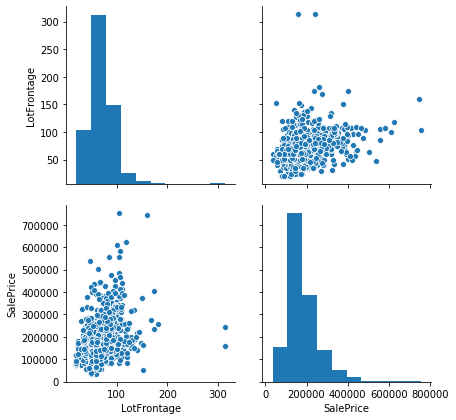

In [1002]:
sns.pairplot(house_data, height=3,
                 vars=["LotFrontage", "SalePrice"])

In [1003]:
house_data=house_data.drop(['LotFrontage'],axis=1) #drop lotFrontage as there is no value in data dictionary to impute

In [1004]:
house_data=house_data.drop(['PoolQC'],axis=1) #As 99.52 % do not have Pool it does not make much difference even if we impute the values

In [1005]:
house_data=house_data.drop(['MiscFeature'],axis=1) #As 96 % do not have Misc Features and even if we delete it it's values is captured in miscVal hence dropping it

## Imputing values based on data dictionary.Putting all of them in one block for easy reference

In [1006]:
house_data.Alley.unique()


array([nan, 'Grvl', 'Pave'], dtype=object)

In [1007]:
house_data.BsmtQual.unique()

array(['Gd', 'TA', 'Ex', nan, 'Fa'], dtype=object)

In [1008]:
house_data.BsmtCond.unique()

array(['TA', 'Gd', nan, 'Fa', 'Po'], dtype=object)

In [1009]:
house_data.BsmtExposure.unique()

array(['No', 'Gd', 'Mn', 'Av', nan], dtype=object)

In [1010]:
house_data.BsmtFinType1.unique()

array(['GLQ', 'ALQ', 'Unf', 'Rec', 'BLQ', nan, 'LwQ'], dtype=object)

In [1011]:
house_data.BsmtFinType2.unique()

array(['Unf', 'BLQ', nan, 'ALQ', 'Rec', 'LwQ', 'GLQ'], dtype=object)

In [1012]:
house_data.FireplaceQu.unique()

array([nan, 'TA', 'Gd', 'Fa', 'Ex', 'Po'], dtype=object)

In [1013]:
house_data.GarageType.unique()

array(['Attchd', 'Detchd', 'BuiltIn', 'CarPort', nan, 'Basment', '2Types'],
      dtype=object)

In [1014]:
house_data.GarageFinish.unique()

array(['RFn', 'Unf', 'Fin', nan], dtype=object)

In [1015]:
house_data.GarageCond.unique()

array(['TA', 'Fa', nan, 'Gd', 'Po', 'Ex'], dtype=object)

In [1016]:
house_data.GarageQual.unique()

array(['TA', 'Fa', 'Gd', nan, 'Ex', 'Po'], dtype=object)

In [1017]:
house_data.Fence.unique()

array([nan, 'MnPrv', 'GdWo', 'GdPrv', 'MnWw'], dtype=object)

In [1018]:
house_data.MasVnrType.unique()

array(['BrkFace', 'None', 'Stone', 'BrkCmn', nan], dtype=object)

## for electrical ,MasVnrType deleting rows with null values as there are a total of 9 rows.

In [1019]:
house_data=house_data[~house_data.MasVnrType.isnull()]

In [1020]:
house_data.Electrical.unique()

array(['SBrkr', 'FuseF', 'FuseA', 'FuseP', 'Mix', nan], dtype=object)

In [1021]:
house_data=house_data[~house_data.Electrical.isnull()]

In [1022]:
house_data['Alley'].fillna('NA', inplace=True) 
house_data['BsmtQual'].fillna('NA', inplace=True)
house_data['BsmtCond'].fillna('NA', inplace=True) 
house_data['BsmtExposure'].fillna('NA', inplace=True) 
house_data['BsmtFinType1'].fillna('NA', inplace=True) 
house_data['BsmtFinType2'].fillna('NA', inplace=True) 
house_data['FireplaceQu'].fillna('NA', inplace=True) 
house_data['GarageType'].fillna('NA', inplace=True) 
house_data['GarageFinish'].fillna('NA', inplace=True) 
house_data['GarageCond'].fillna('NA', inplace=True) 
house_data['GarageQual'].fillna('NA', inplace=True) 
house_data['Fence'].fillna('NA', inplace=True) 

In [1023]:
house_data.GarageYrBlt.isnull().sum()

81

## changing data to number of years rater than year .


In [1024]:
#converting year to number of years
house_data['YearBuilt'] = 2020 - house_data['YearBuilt']
house_data['YearRemodAdd'] = 2020 - house_data['YearRemodAdd']
house_data['GarageYrBlt'] = 2020 - house_data['GarageYrBlt']
house_data['YrSold'] = 2020 - house_data['YrSold']

In [1025]:
house_data['GarageYrBlt'].fillna(0,inplace=True) ## filling the nofo years to 0 for null values.

In [1026]:
house_data['YearBuilt'].describe()

count    1451.000000
mean       48.907650
std        30.190266
min        10.000000
25%        20.000000
50%        48.000000
75%        66.000000
max       148.000000
Name: YearBuilt, dtype: float64

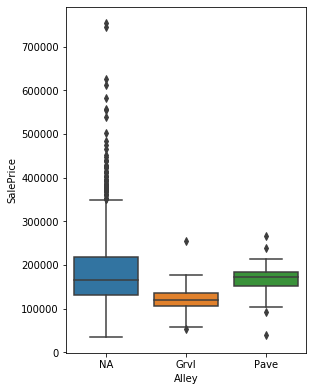

In [1027]:
plt.figure(figsize=(25, 14))
plt.subplot(2,5,1)
sns.boxplot(x = 'Alley', y = 'SalePrice', data = house_data)

In [1028]:
house_data=house_data.drop(['Id'],axis=1) # deleting id as it is of no use.

## checking the importance of MOSold

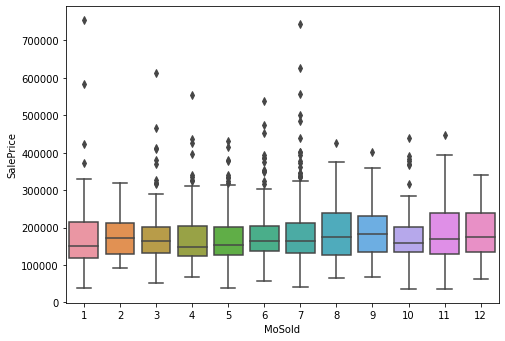

In [1029]:
plt.figure(figsize=(45, 12))
plt.subplot(2,5,1)
sns.boxplot(x = 'MoSold', y = 'SalePrice', data = house_data)

In [1030]:
house_data.MoSold.corr(house_data.SalePrice) #As it is not making much of a difference let us drop this column .and as
#years are converted into number of years old it is not making much purpose

0.0450846012958176

In [1031]:
house_data=house_data.drop(['MoSold'],axis=1) #dropping MoSold

In [1032]:
## convert ordered variables to numeric

# Data Preparation

In [1033]:

house_data['LandSlope'] = house_data.LandSlope.map({'Gtl':0,'Mod':1,'Sev':2})
house_data['ExterQual'] = house_data.ExterQual.map({'Po':0,'Fa':1,'TA':2,'Gd':3,'Ex':4})
house_data['BsmtQual'] = house_data.BsmtQual.map({'NA':0,'Po':1,'Fa':2,'TA':3,'Gd':4,'Ex':5})
house_data['BsmtCond'] = house_data.BsmtCond.map({'NA':0,'Po':1,'Fa':2,'TA':3,'Gd':4,'Ex':5})
house_data['BsmtExposure'] = house_data.BsmtExposure.map({'NA':0,'No':1,'Mn':2,'Av':3,'Gd':4})
house_data['BsmtFinType1'] = house_data.BsmtFinType1.map({'NA':0,'Unf':1,'LwQ':2,'Rec':3,'BLQ':4,'ALQ':5,'GLQ':6})
house_data['BsmtFinType2'] = house_data.BsmtFinType2.map({'NA':0,'Unf':1,'LwQ':2,'Rec':3,'BLQ':4,'ALQ':5,'GLQ':6})
house_data['HeatingQC'] = house_data.HeatingQC.map({'Po':0,'Fa':1,'TA':2,'Gd':3,'Ex':4})
house_data['CentralAir'] = house_data.CentralAir.map({'N':0,'Y':1})
house_data['KitchenQual'] = house_data.KitchenQual.map({'Po':0,'Fa':1,'TA':2,'Gd':3,'Ex':4})
house_data['GarageFinish'] = house_data.GarageFinish.map({'NA':0,'Unf':1,'RFn':2,'Fin':3})
house_data['GarageQual'] = house_data.GarageQual.map({'NA':0,'Po':1,'Fa':2,'TA':3,'Gd':4,'Ex':5})
house_data['GarageCond'] = house_data.GarageCond.map({'NA':0,'Po':1,'Fa':2,'TA':3,'Gd':4,'Ex':5})
house_data['ExterCond'] = house_data.ExterCond.map({'Po':0,'Fa':1,'TA':2,'Gd':3,'Ex':4})
house_data['LotShape'] = house_data.LotShape.map({'IR1':0,'IR2':1,'IR3':2,'Reg':3})

In [1034]:
house_data.head()

,MSSubClass,MSZoning,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,8450,Pave,NA,3,Lvl,AllPub,Inside,0,CollgCr,Norm,Norm,1Fam,2Story,7,5,17,17,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,3,2,PConc,4,3,1,6,706,1,0,150,856,GasA,4,1,SBrkr,856,854,0,1710,1,0,2,1,3,1,3,8,Typ,0,NA,Attchd,17.0,2,2,548,3,3,Y,0,61,0,0,0,0,NA,0,12,WD,Normal,208500
1,20,RL,9600,Pave,NA,3,Lvl,AllPub,FR2,0,Veenker,Feedr,Norm,1Fam,1Story,6,8,44,44,Gable,CompShg,MetalSd,MetalSd,None,0.0,2,2,CBlock,4,3,4,5,978,1,0,284,1262,GasA,4,1,SBrkr,1262,0,0,1262,0,1,2,0,3,1,2,6,Typ,1,TA,Attchd,44.0,2,2,460,3,3,Y,298,0,0,0,0,0,NA,0,13,WD,Normal,181500
2,60,RL,11250,Pave,NA,0,Lvl,AllPub,Inside,0,CollgCr,Norm,Norm,1Fam,2Story,7,5,19,18,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,3,2,PConc,4,3,2,6,486,1,0,434,920,GasA,4,1,SBrkr,920,866,0,1786,1,0,2,1,3,1,3,6,Typ,1,TA,Attchd,19.0,2,2,608,3,3,Y,0,42,0,0,0,0,NA,0,12,WD,Normal,223500
3,70,RL,9550,Pave,NA,0,Lvl,AllPub,Corner,0,Crawfor,Norm,Norm,1Fam,2Story,7,5,105,50,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,2,2,BrkTil,3,4,1,5,216,1,0,540,756,GasA,3,1,SBrkr,961,756,0,1717,1,0,1,0,3,1,3,7,Typ,1,Gd,Detchd,22.0,1,3,642,3,3,Y,0,35,272,0,0,0,NA,0,14,WD,Abnorml,140000
4,60,RL,14260,Pave,NA,0,Lvl,AllPub,FR2,0,NoRidge,Norm,Norm,1Fam,2Story,8,5,20,20,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,3,2,PConc,4,3,3,6,655,1,0,490,1145,GasA,4,1,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,3,9,Typ,1,TA,Attchd,20.0,2,3,836,3,3,Y,192,84,0,0,0,0,NA,0,12,WD,Normal,250000


In [1035]:
#cheking for variance in street and Utitlities.
house_data.Street.value_counts()

Pave    1445
Grvl       6
Name: Street, dtype: int64

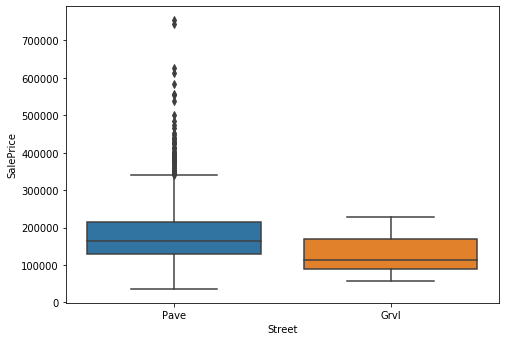

In [1036]:
#As all the values are mostly of one type they can be dropped
plt.figure(figsize=(45, 12))
plt.subplot(2,5,1)
sns.boxplot(x = 'Street', y = 'SalePrice', data = house_data)

In [1037]:
house_data.Utilities.value_counts()

AllPub    1450
NoSeWa       1
Name: Utilities, dtype: int64

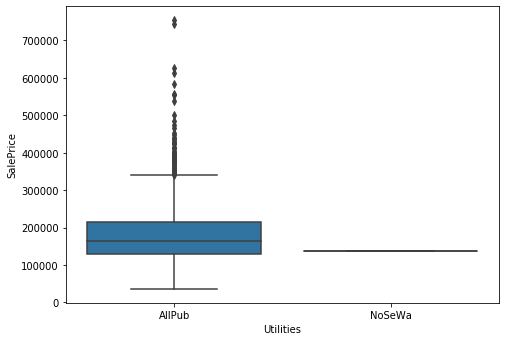

In [1038]:
#As all the values are mostly of one type they can be dropped
plt.figure(figsize=(45, 12))
plt.subplot(2,5,1)
sns.boxplot(x = 'Utilities', y = 'SalePrice', data = house_data)

In [1039]:
house_data=house_data.drop(['Street'],axis=1)

In [1040]:
house_data=house_data.drop(['Utilities'],axis=1)

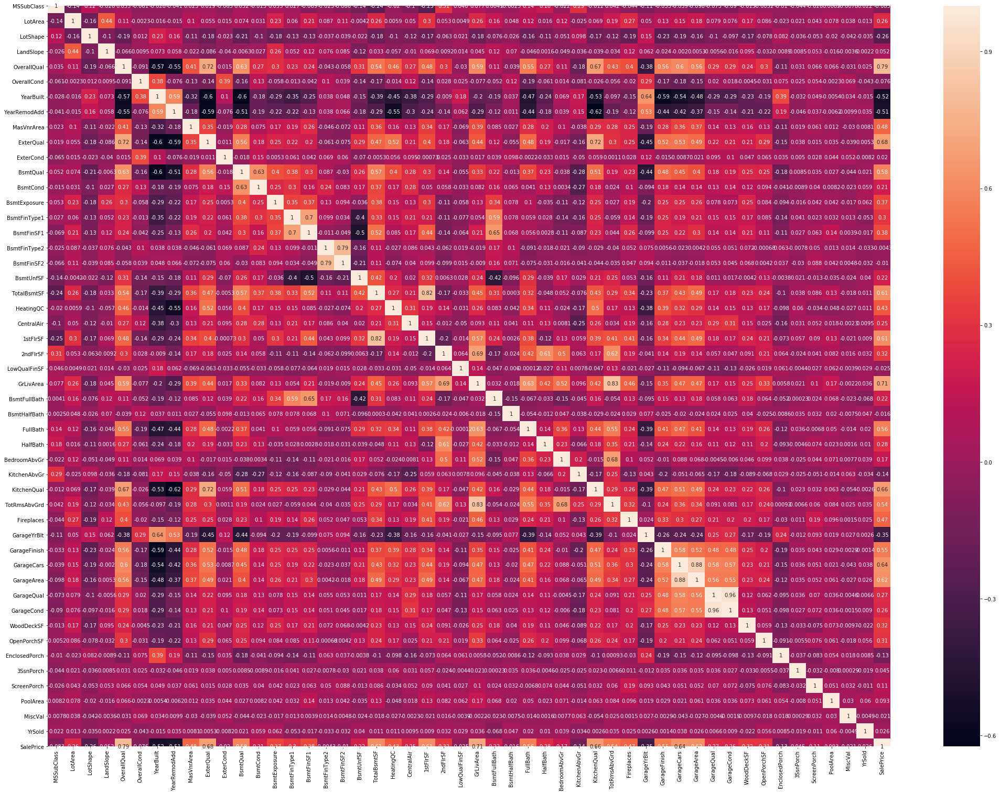

In [1041]:

plt.figure(figsize=(36,26))
sns.heatmap(house_data[list(house_data.dtypes[house_data.dtypes!='object'].index)].corr(),annot=True)
plt.show()

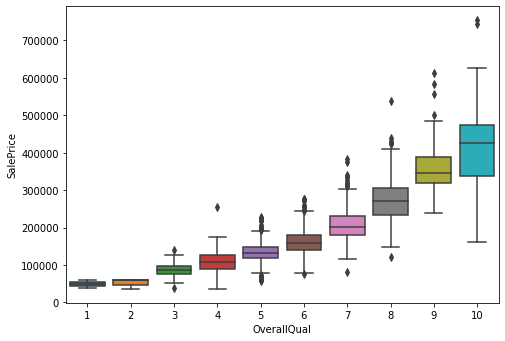

In [1042]:
#As all the values are mostly of one type they can be dropped
plt.figure(figsize=(45, 12))
plt.subplot(2,5,1)
sns.boxplot(x = 'OverallQual', y = 'SalePrice', data = house_data)

In [1043]:

house_data[list(house_data.dtypes[house_data.dtypes=='object'].index)].head()

,MSZoning,Alley,LandContour,LotConfig,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,Foundation,Heating,Electrical,Functional,FireplaceQu,GarageType,PavedDrive,Fence,SaleType,SaleCondition
0,RL,NA,Lvl,Inside,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,PConc,GasA,SBrkr,Typ,NA,Attchd,Y,NA,WD,Normal
1,RL,NA,Lvl,FR2,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,CBlock,GasA,SBrkr,Typ,TA,Attchd,Y,NA,WD,Normal
2,RL,NA,Lvl,Inside,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,PConc,GasA,SBrkr,Typ,TA,Attchd,Y,NA,WD,Normal
3,RL,NA,Lvl,Corner,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,BrkTil,GasA,SBrkr,Typ,Gd,Detchd,Y,NA,WD,Abnorml
4,RL,NA,Lvl,FR2,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,PConc,GasA,SBrkr,Typ,TA,Attchd,Y,NA,WD,Normal


In [1044]:
house_data[list(house_data.dtypes[house_data.dtypes=='object'].index)].nunique()

MSZoning          5
Alley             3
LandContour       4
LotConfig         5
Neighborhood     25
Condition1        9
Condition2        8
BldgType          5
HouseStyle        8
RoofStyle         6
RoofMatl          8
Exterior1st      15
Exterior2nd      16
MasVnrType        4
Foundation        6
Heating           6
Electrical        5
Functional        7
FireplaceQu       6
GarageType        7
PavedDrive        3
Fence             5
SaleType          9
SaleCondition     6
dtype: int64

In [1045]:
house_data[list(house_data.dtypes[house_data.dtypes=='object'].index)].shape

(1451, 24)

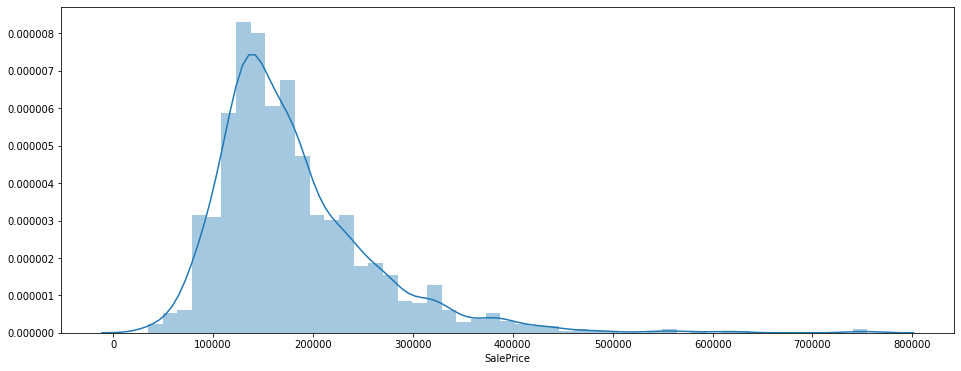

In [1046]:
plt.figure(figsize=(16,6))
sns.distplot(house_data.SalePrice)
plt.show()

## saleprice is right skewed hence we can apply log transformation to normalize the target variable.

In [1047]:
#value = house_data.SalePrice
shapiro(house_data.SalePrice)[1] # finding out the skew

4.015896084669891e-33

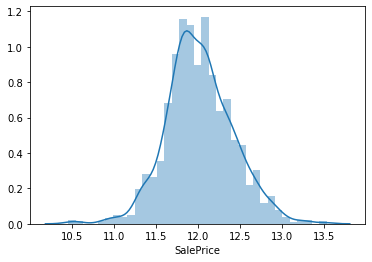

In [1048]:
#Apply log transformation
sns.distplot(np.log(house_data.SalePrice))

In [1049]:
house_data.SalePrice=np.log(house_data.SalePrice) #transform skewed variables to normal

In [1050]:
house_data.SalePrice.describe()



count    1451.000000
mean       12.022388
std         0.399502
min        10.460242
25%        11.774520
50%        11.998433
75%        12.273731
max        13.534473
Name: SalePrice, dtype: float64

In [1051]:
shapiro(house_data.SalePrice)[1]

1.1055715987140502e-07

In [1052]:

# all numeric (float and int) variables in the dataset
house_data_numeric = house_data.select_dtypes(include=['float64', 'int64'])
house_data_numeric.head()

,MSSubClass,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,YrSold,SalePrice
0,60,8450,3,0,7,5,17,17,196.0,3,2,4,3,1,6,706,1,0,150,856,4,1,856,854,0,1710,1,0,2,1,3,1,3,8,0,17.0,2,2,548,3,3,0,61,0,0,0,0,0,12,12.247694
1,20,9600,3,0,6,8,44,44,0.0,2,2,4,3,4,5,978,1,0,284,1262,4,1,1262,0,0,1262,0,1,2,0,3,1,2,6,1,44.0,2,2,460,3,3,298,0,0,0,0,0,0,13,12.109011
2,60,11250,0,0,7,5,19,18,162.0,3,2,4,3,2,6,486,1,0,434,920,4,1,920,866,0,1786,1,0,2,1,3,1,3,6,1,19.0,2,2,608,3,3,0,42,0,0,0,0,0,12,12.317167
3,70,9550,0,0,7,5,105,50,0.0,2,2,3,4,1,5,216,1,0,540,756,3,1,961,756,0,1717,1,0,1,0,3,1,3,7,1,22.0,1,3,642,3,3,0,35,272,0,0,0,0,14,11.849398
4,60,14260,0,0,8,5,20,20,350.0,3,2,4,3,3,6,655,1,0,490,1145,4,1,1145,1053,0,2198,1,0,2,1,4,1,3,9,1,20.0,2,3,836,3,3,192,84,0,0,0,0,0,12,12.429216


In [1053]:
plt.figure(figsize=(20, 10))
sns.pairplot(house_data_numeric)
plt.show()

<Figure size 1440x720 with 0 Axes>

In [949]:
house_data_bject = house_data.select_dtypes(include=['object'])
house_data_bject

,MSZoning,Alley,LandContour,LotConfig,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,Foundation,Heating,Electrical,Functional,FireplaceQu,GarageType,PavedDrive,Fence,SaleType,SaleCondition
0,RL,NA,Lvl,Inside,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,PConc,GasA,SBrkr,Typ,NA,Attchd,Y,NA,WD,Normal
1,RL,NA,Lvl,FR2,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,CBlock,GasA,SBrkr,Typ,TA,Attchd,Y,NA,WD,Normal
2,RL,NA,Lvl,Inside,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,PConc,GasA,SBrkr,Typ,TA,Attchd,Y,NA,WD,Normal
3,RL,NA,Lvl,Corner,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,BrkTil,GasA,SBrkr,Typ,Gd,Detchd,Y,NA,WD,Abnorml
4,RL,NA,Lvl,FR2,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,PConc,GasA,SBrkr,Typ,TA,Attchd,Y,NA,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,RL,NA,Lvl,Inside,Gilbert,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,None,PConc,GasA,SBrkr,Typ,TA,Attchd,Y,NA,WD,Normal
1456,RL,NA,Lvl,Inside,NWAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,Plywood,Plywood,Stone,CBlock,GasA,SBrkr,Min1,TA,Attchd,Y,MnPrv,WD,Normal
1457,RL,NA,Lvl,Inside,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,CemntBd,CmentBd,None,Stone,GasA,SBrkr,Typ,Gd,Attchd,Y,GdPrv,WD,Normal
1458,RL,NA,Lvl,Inside,NAmes,Norm,Norm,1Fam,1Story,Hip,CompShg,MetalSd,MetalSd,None,CBlock,GasA,FuseA,Typ,NA,Attchd,Y,NA,WD,Normal


## creating dummy variables and scaling numeric variables

In [950]:
# all numeric (float and int) variables in the dataset
house_data_numeric = house_data.select_dtypes(include=['float64', 'int64'])
#house_data_numeric.head()
numeric_column=house_data_numeric.columns

scaler = StandardScaler()
house_data[numeric_column] = scaler.fit_transform(house_data[numeric_column])

In [951]:
# creating dummy variables for categorical variables

# subset all categorical variables
house_categorical = house_data.select_dtypes(include=['object'])
house_categorical.head()

,MSZoning,Alley,LandContour,LotConfig,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,Foundation,Heating,Electrical,Functional,FireplaceQu,GarageType,PavedDrive,Fence,SaleType,SaleCondition
0,RL,NA,Lvl,Inside,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,PConc,GasA,SBrkr,Typ,NA,Attchd,Y,NA,WD,Normal
1,RL,NA,Lvl,FR2,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,CBlock,GasA,SBrkr,Typ,TA,Attchd,Y,NA,WD,Normal
2,RL,NA,Lvl,Inside,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,PConc,GasA,SBrkr,Typ,TA,Attchd,Y,NA,WD,Normal
3,RL,NA,Lvl,Corner,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,BrkTil,GasA,SBrkr,Typ,Gd,Detchd,Y,NA,WD,Abnorml
4,RL,NA,Lvl,FR2,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,PConc,GasA,SBrkr,Typ,TA,Attchd,Y,NA,WD,Normal


In [952]:
# convert into dummies
house_dummies = pd.get_dummies(house_categorical, drop_first=True)
house_dummies.head()

,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Alley_NA,Alley_Pave,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,...,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_NA,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,...,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0
1,0,0,1,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0
2,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,...,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0
3,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
4,0,0,1,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,...,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0


In [953]:
# drop categorical variables 
house_data = house_data.drop(list(house_categorical.columns), axis=1)

In [954]:
# concat dummy variables with X
house_data = pd.concat([house_data, house_dummies], axis=1)

In [955]:
house_data_numeric = house_data.select_dtypes(include=['float64', 'int64'])
house_data_numeric

,MSSubClass,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,YrSold,SalePrice
0,0.072441,-0.205996,0.752128,-0.226451,0.656247,-0.520740,-1.057250,-0.883532,0.509503,1.061428,-0.238892,0.586116,0.119651,-0.592020,1.166946,0.579345,-0.278114,-0.289621,-0.943764,-0.457576,0.893943,0.264687,-0.793908,1.162628,-0.120619,0.372562,1.110846,-0.241851,0.795528,1.231851,0.163244,-0.21037,0.740674,0.912116,-0.952520,-0.864715,0.324513,0.313988,0.352525,0.263411,0.266499,-0.752932,0.220747,-0.359363,-0.116704,-0.271106,-0.068905,-0.087961,-0.138985,0.564163
1,-0.872386,-0.090876,0.752128,-0.226451,-0.067870,2.174601,-0.162613,0.424340,-0.573097,-0.684753,-0.238892,0.586116,0.119651,2.218301,0.691984,1.176868,-0.278114,-0.289621,-0.640635,0.469865,0.893943,0.264687,0.260994,-0.794728,-0.120619,-0.479767,-0.817189,3.935838,0.795528,-0.758590,0.163244,-0.21037,-0.766644,-0.317884,0.602156,0.181225,0.324513,0.313988,-0.058502,0.263411,0.266499,1.623585,-0.702973,-0.359363,-0.116704,-0.271106,-0.068905,-0.087961,0.613506,0.216902
2,0.072441,0.074297,-1.376620,-0.226451,0.656247,-0.520740,-0.990980,-0.835093,0.321705,1.061428,-0.238892,0.586116,0.119651,0.344753,1.166946,0.096054,-0.278114,-0.289621,-0.301312,-0.311378,0.893943,0.264687,-0.627618,1.190131,-0.120619,0.517154,1.110846,-0.241851,0.795528,1.231851,0.163244,-0.21037,0.740674,-0.317884,0.602156,-0.787238,0.324513,0.313988,0.632770,0.263411,0.266499,-0.752932,-0.066969,-0.359363,-0.116704,-0.271106,-0.068905,-0.087961,-0.138985,0.738120
3,0.308648,-0.095881,-1.376620,-0.226451,0.656247,-0.520740,1.858602,0.714978,-0.573097,-0.684753,-0.238892,-0.553903,1.928133,-0.592020,0.691984,-0.497076,-0.278114,-0.289621,-0.061524,-0.686010,-0.147913,0.264687,-0.521089,0.938013,-0.120619,0.385880,1.110846,-0.241851,-1.022285,-0.758590,0.163244,-0.21037,0.740674,0.297116,0.602156,-0.671022,-0.796602,1.650046,0.791576,0.263411,0.266499,-0.752932,-0.172970,4.093291,-0.116704,-0.271106,-0.068905,-0.087961,1.365998,-0.433165
4,0.072441,0.375612,-1.376620,-0.226451,1.380365,-0.520740,-0.957846,-0.738213,1.360116,1.061428,-0.238892,0.586116,0.119651,1.281527,1.166946,0.467309,-0.278114,-0.289621,-0.174632,0.202598,0.893943,0.264687,-0.043005,1.618733,-0.120619,1.300993,1.110846,-0.241851,0.795528,1.231851,1.390532,-0.21037,0.740674,1.527117,0.602156,-0.748499,0.324513,1.650046,1.697704,0.263411,0.266499,0.778247,0.569034,-0.359363,-0.116704,-0.271106,-0.068905,-0.087961,-0.138985,1.018690
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,0.072441,-0.259352,0.752128,-0.226451,-0.067870,-0.520740,-0.924711,-0.738213,-0.573097,-0.684753,-0.238892,0.586116,0.119651,-0.592020,-1.207863,-0.971580,-0.278114,-0.289621,0.872745,-0.235995,0.893943,0.264687,-0.541875,0.795910,-0.120619,0.252704,-0.817189,-0.241851,0.795528,1.231851,0.163244,-0.21037,-0.766644,0.297116,0.602156,-0.709761,0.324513,0.313988,-0.058502,0.263411,0.266499,-0.752932,-0.097255,-0.359363,-0.116704,-0.271106,-0.068905,-0.087961,0.613506,0.125583
1456,-0.872386,0.266998,0.752128,-0.226451,-0.067870,0.377707,-0.228883,-0.156937,0.084196,-0.684753,-0.238892,0.586116,0.119651,-0.592020,0.691984,0.763874,1.957583,0.718284,0.049321,1.109480,-1.189770,0.264687,2.368200,-0.794728,-0.120619,1.063178,1.110846,-0.241851,0.795528,-0.758590,0.163244,-0.21037,-0.766644,0.297116,2.156832,0.103748,-0.796602,0.313988,0.128328,0.263411,0.266

In [956]:
house_data

,MSSubClass,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,YrSold,SalePrice,...,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_NA,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0.072441,-0.205996,0.752128,-0.226451,0.656247,-0.520740,-1.057250,-0.883532,0.509503,1.061428,-0.238892,0.586116,0.119651,-0.592020,1.166946,0.579345,-0.278114,-0.289621,-0.943764,-0.457576,0.893943,0.264687,-0.793908,1.162628,-0.120619,0.372562,1.110846,-0.241851,0.795528,1.231851,0.163244,-0.21037,0.740674,0.912116,-0.952520,-0.864715,0.324513,0.313988,0.352525,0.263411,0.266499,-0.752932,0.220747,-0.359363,-0.116704,-0.271106,-0.068905,-0.087961,-0.138985,0.564163,...,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0
1,-0.872386,-0.090876,0.752128,-0.226451,-0.067870,2.174601,-0.162613,0.424340,-0.573097,-0.684753,-0.238892,0.586116,0.119651,2.218301,0.691984,1.176868,-0.278114,-0.289621,-0.640635,0.469865,0.893943,0.264687,0.260994,-0.794728,-0.120619,-0.479767,-0.817189,3.935838,0.795528,-0.758590,0.163244,-0.21037,-0.766644,-0.317884,0.602156,0.181225,0.324513,0.313988,-0.058502,0.263411,0.266499,1.623585,-0.702973,-0.359363,-0.116704,-0.271106,-0.068905,-0.087961,0.613506,0.216902,...,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0
2,0.072441,0.074297,-1.376620,-0.226451,0.656247,-0.520740,-0.990980,-0.835093,0.321705,1.061428,-0.238892,0.586116,0.119651,0.344753,1.166946,0.096054,-0.278114,-0.289621,-0.301312,-0.311378,0.893943,0.264687,-0.627618,1.190131,-0.120619,0.517154,1.110846,-0.241851,0.795528,1.231851,0.163244,-0.21037,0.740674,-0.317884,0.602156,-0.787238,0.324513,0.313988,0.632770,0.263411,0.266499,-0.752932,-0.066969,-0.359363,-0.116704,-0.271106,-0.068905,-0.087961,-0.138985,0.738120,...,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0
3,0.308648,-0.095881,-1.376620,-0.226451,0.656247,-0.520740,1.858602,0.714978,-0.573097,-0.684753,-0.238892,-0.553903,1.928133,-0.592020,0.691984,-0.497076,-0.278114,-0.289621,-0.061524,-0.686010,-0.147913,0.264687,-0.521089,0.938013,-0.120619,0.385880,1.110846,-0.241851,-1.022285,-0.758590,0.163244,-0.21037,0.740674,0.297116,0.602156,-0.671022,-0.796602,1.650046,0.791576,0.263411,0.266499,-0.752932,-0.172970,4.093291,-0.116704,-0.271106,-0.068905,-0.087961,1.365998,-0.433165,...,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
4,0.072441,0.375612,-1.376620,-0.226451,1.380365,-0.520740,-0.957846,-0.738213,1.360116,1.061428,-0.238892,0.586116,0.119651,1.281527,1.166946,0.467309,-0.278114,-0.289621,-0.174632,0.202598,0.893943,0.264687,-0.043005,1.618733,-0.120619,1.300993,1.110846,-0.241851,0.795528,1.231851,1.390532,-0.21037,0.740674,1.527117,0.602156,-0.748499,0.324513,1

## divide the data set into target varaibles and independent varriables.

In [957]:
y=house_data.pop('SalePrice')
X=house_data

In [958]:
# split into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    train_size=0.7,
                                                    test_size = 0.3, random_state=100)

In [959]:
X_train

,MSSubClass,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,YrSold,MSZoning_FV,...,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_NA,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
801,-0.636180,-0.571378,0.752128,-0.226451,-1.516106,1.276154,1.825467,-0.253816,-0.573097,-0.684753,-0.238892,-0.553903,0.119651,-0.592020,-0.732901,-0.538814,-0.278114,-0.289621,0.976804,0.319099,0.893943,0.264687,0.089507,-0.794728,-0.120619,-0.605333,1.110846,-0.241851,-1.022285,-0.758590,-1.064044,-0.21037,-0.766644,-0.932885,-0.952520,0.917256,-0.796602,0.313988,-0.151917,0.263411,0.266499,-0.752932,-0.702973,-0.359363,-0.116704,-0.271106,-0.068905,-0.087961,0.613506,0,...,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0
569,0.781062,-0.347945,-1.376620,-0.226451,-0.791988,-0.520740,-0.262017,0.279021,-0.573097,-0.684753,-0.238892,0.586116,0.119651,2.218301,1.166946,1.099981,-0.278114,-0.289621,-1.283087,-0.258839,-1.189770,0.264687,-0.567858,-0.794728,-0.120619,-1.086671,1.110846,-0.241851,-1.022285,-0.758590,-1.064044,-0.21037,-0.766644,-1.547885,2.156832,0.065009,-0.796602,0.313988,0.595404,0.263411,0.266499,-0.417986,-0.702973,-0.359363,-0.116704,-0.271106,-0.068905,-0.087961,1.365998,0,...,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0
1181,1.489682,-0.492596,-1.376620,3.384320,1.380365,-0.520740,-1.222923,-1.125731,0.454268,2.807609,-0.238892,1.726135,0.119651,2.218301,1.166946,2.279650,-0.278114,-0.289621,-1.011628,1.241971,0.893943,0.264687,1.274323,-0.794728,-0.120619,0.262216,1.110846,3.935838,0.795528,-0.758590,-1.064044,-0.21037,0.740674,-0.932885,0.602156,-1.058407,1.445628,0.313988,0.044255,0.263411,0.266499,0.539000,0.099603,-0.359363,5.087943,-0.271106,-0.068905,-0.087961,-0.138985,0,...,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1
808,0.544855,0.289522,0.752128,-0.226451,-0.791988,-0.520740,0.168733,0.908737,5.209972,-0.684753,-0.238892,-0.553903,0.119651,1.281527,0.691984,0.161957,3.075431,0.501862,-0.423468,-0.073807,-1.189770,0.264687,-0.196304,-0.794728,-0.120619,-0.814611,1.110846,-0.241851,-1.022285,-0.758590,0.163244,-0.21037,-0.766644,-0.317884,0.602156,0.568610,0.324513,0.313988,0.053596,0.263411,0.266499,-0.752932,-0.702973,-0.359363,-0.116704,-0.271106,-0.068905,-0.087961,1.365998,0,...,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1095,-0.872386,-0.119205,-1.376620,-0.226451,-0.067870,-0.520740,-1.156654,-1.028852,-0.573097,1.061428,-0.238892,0.586116,0.119651,-0.592020,1.166946,-0.918857,-0.278114,-0.289621,1.635091,0.588651,-0.147913,0.264687,0.396104,-0.794728,-0.120619,-0.380836,-0.817189,-0.241851,0.795528,-0.758590,0.163244,-0.21037,0.740674,-0.317884,0.602156,-0.980930,0.32

## feature selection using RFE

In [960]:
lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, 50)             # running RFE
rfe = rfe.fit(X_train, y_train)

In [961]:
#getting the ranking of the dependent variables
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('MSSubClass', False, 154),
 ('LotArea', False, 52),
 ('LotShape', False, 142),
 ('LandSlope', False, 97),
 ('OverallQual', True, 1),
 ('OverallCond', False, 4),
 ('YearBuilt', True, 1),
 ('YearRemodAdd', False, 43),
 ('MasVnrArea', False, 123),
 ('ExterQual', False, 90),
 ('ExterCond', False, 119),
 ('BsmtQual', False, 133),
 ('BsmtCond', False, 102),
 ('BsmtExposure', False, 109),
 ('BsmtFinType1', False, 72),
 ('BsmtFinSF1', True, 1),
 ('BsmtFinType2', False, 129),
 ('BsmtFinSF2', False, 32),
 ('BsmtUnfSF', False, 33),
 ('TotalBsmtSF', False, 9),
 ('HeatingQC', False, 99),
 ('CentralAir', False, 137),
 ('1stFlrSF', False, 30),
 ('2ndFlrSF', False, 29),
 ('LowQualFinSF', False, 34),
 ('GrLivArea', True, 1),
 ('BsmtFullBath', False, 63),
 ('BsmtHalfBath', False, 146),
 ('FullBath', False, 156),
 ('HalfBath', False, 118),
 ('BedroomAbvGr', False, 148),
 ('KitchenAbvGr', False, 46),
 ('KitchenQual', False, 70),
 ('TotRmsAbvGrd', False, 147),
 ('Fireplaces', False, 110),
 ('GarageYrBlt'

In [962]:
#Getting the columns needed from RFE
columns_needed = X_train.columns[rfe.support_]
columns_needed

Index(['OverallQual', 'YearBuilt', 'BsmtFinSF1', 'GrLivArea', 'GarageCars',
       'MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL', 'MSZoning_RM',
       'Neighborhood_BrkSide', 'Neighborhood_Crawfor', 'Neighborhood_MeadowV',
       'Neighborhood_StoneBr', 'Condition1_Norm', 'Condition1_RRAe',
       'Condition1_RRNn', 'Condition2_Feedr', 'Condition2_PosN',
       'Condition2_RRAn', 'RoofStyle_Shed', 'RoofMatl_CompShg',
       'RoofMatl_Metal', 'RoofMatl_Roll', 'RoofMatl_Tar&Grv',
       'RoofMatl_WdShake', 'RoofMatl_WdShngl', 'Exterior1st_BrkComm',
       'Exterior1st_BrkFace', 'Exterior1st_CemntBd', 'Exterior2nd_CmentBd',
       'Exterior2nd_ImStucc', 'Exterior2nd_Other', 'Foundation_Wood',
       'Heating_GasA', 'Heating_GasW', 'Electrical_FuseP', 'Electrical_Mix',
       'Functional_Maj2', 'Functional_Min1', 'Functional_Min2',
       'Functional_Mod', 'Functional_Sev', 'Functional_Typ',
       'GarageType_CarPort', 'SaleType_Con', 'SaleType_ConLD', 'SaleType_Oth',
       'SaleCondition

In [963]:
#columns which would be removed
X_train.columns[~rfe.support_]

Index(['MSSubClass', 'LotArea', 'LotShape', 'LandSlope', 'OverallCond',
       'YearRemodAdd', 'MasVnrArea', 'ExterQual', 'ExterCond', 'BsmtQual',
       ...
       'Fence_MnPrv', 'Fence_MnWw', 'Fence_NA', 'SaleType_CWD',
       'SaleType_ConLI', 'SaleType_ConLw', 'SaleType_New', 'SaleType_WD',
       'SaleCondition_AdjLand', 'SaleCondition_Alloca'],
      dtype='object', length=156)

In [964]:
X_train_rfe = X_train[columns_needed]

In [965]:
X_test_rfe=X_test[columns_needed]

In [966]:
X_train_rfe

,OverallQual,YearBuilt,BsmtFinSF1,GrLivArea,GarageCars,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Neighborhood_BrkSide,Neighborhood_Crawfor,Neighborhood_MeadowV,Neighborhood_StoneBr,Condition1_Norm,Condition1_RRAe,Condition1_RRNn,Condition2_Feedr,Condition2_PosN,Condition2_RRAn,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior2nd_CmentBd,Exterior2nd_ImStucc,Exterior2nd_Other,Foundation_Wood,Heating_GasA,Heating_GasW,Electrical_FuseP,Electrical_Mix,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_CarPort,SaleType_Con,SaleType_ConLD,SaleType_Oth,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
801,-1.516106,1.825467,-0.538814,-0.605333,0.313988,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
569,-0.791988,-0.262017,1.099981,-1.086671,0.313988,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
1181,1.380365,-1.222923,2.279650,0.262216,0.313988,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
808,-0.791988,0.168733,0.161957,-0.814611,0.313988,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
1095,-0.067870,-1.156654,-0.918857,-0.380836,0.313988,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
805,0.656247,-1.222923,-0.971580,-0.163949,0.313988,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
53,2.104483,-0.328287,3.004587,0.623695,1.650046,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
351,0.656247,-0.493960,1.405333,-0.116386,0.313988,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
79,-0.791988,2.024275,-0.971580,-0.540648,0.313988,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0


In [967]:
y_train.describe()

count    1015.000000
mean        0.011392
std         1.002803
min        -3.911586
25%        -0.618730
50%        -0.052290
75%         0.642197
max         3.752847
Name: SalePrice, dtype: float64

## LASSO

## perform lasso using GridSearchCV

In [968]:

folds = KFold(n_splits=10,shuffle=True,random_state=42)

hyper_param = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,100,500,1000 ]}

model = Lasso()

model_cv = GridSearchCV(estimator = model,
                        param_grid=hyper_param,
                        scoring='r2',
                        cv=folds,
                        verbose=1,
                        return_train_score=True
                       )

model_cv.fit(X_train_rfe,y_train)

Fitting 10 folds for each of 28 candidates, totalling 280 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 280 out of 280 | elapsed:    3.3s finished


GridSearchCV(cv=KFold(n_splits=10, random_state=42, shuffle=True),
             error_score='raise-deprecating',
             estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=1000, normalize=False, positive=False,
                             precompute=False, random_state=None,
                             selection='cyclic', tol=0.0001, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='r2', verbose=1)

In [969]:

cv_result_l = pd.DataFrame(model_cv.cv_results_)
cv_result_l['param_alpha'] = cv_result_l['param_alpha'].astype('float32')
cv_result_l.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
0,0.029448,0.030043,0.002798,0.002872,0.0001,{'alpha': 0.0001},0.876043,0.315124,0.913031,0.928614,0.484981,0.868041,0.916123,0.847366,0.895584,0.884181,0.792469,0.201766,2,0.912481,0.914122,0.909274,0.906118,0.910253,0.913139,0.907864,0.913600,0.911345,0.912255,0.911045,0.002493
1,0.013632,0.003965,0.000999,0.002364,0.0010,{'alpha': 0.001},0.884033,0.320607,0.897648,0.918240,0.757255,0.859118,0.890426,0.830257,0.887504,0.860282,0.810266,0.169180,1,0.872018,0.905159,0.867007,0.864663,0.872257,0.871800,0.865879,0.873027,0.870019,0.870700,0.873253,0.010986
2,0.003450,0.004086,0.002976,0.004115,0.0100,{'alpha': 0.01},0.841028,0.383473,0.865610,0.893995,0.743661,0.836217,0.849825,0.809760,0.866033,0.823700,0.791105,0.141567,3,0.820994,0.852998,0.817101,0.810241,0.830741,0.822085,0.817791,0.823868,0.818556,0.821953,0.823633,0.010986
3,0.004557,0.004609,0.002524,0.003868,0.0500,{'alpha': 0.05},0.820496,0.421381,0.848017,0.862678,0.721442,0.802574,0.827339,0.788548,0.847460,0.809670,0.774763,0.124013,4,0.800644,0.833394,0.794553,0.788164,0.810554,0.798629,0.795508,0.802909,0.796164,0.799995,0.802052,0.011832
4,0.006670,0.002949,0.000198,0.000396,0.1000,{'alpha': 0.1},0.800861,0.511502,0.820471,0.828521,0.712728,0.772542,0.802974,0.765912,0.823109,0.788049,0.762530,0.090046,5,0.783313,0.817087,0.776846,0.770022,0.793975,0.782121,0.778137,0.785311,0.778967,0.783242,0.784902,0.012242


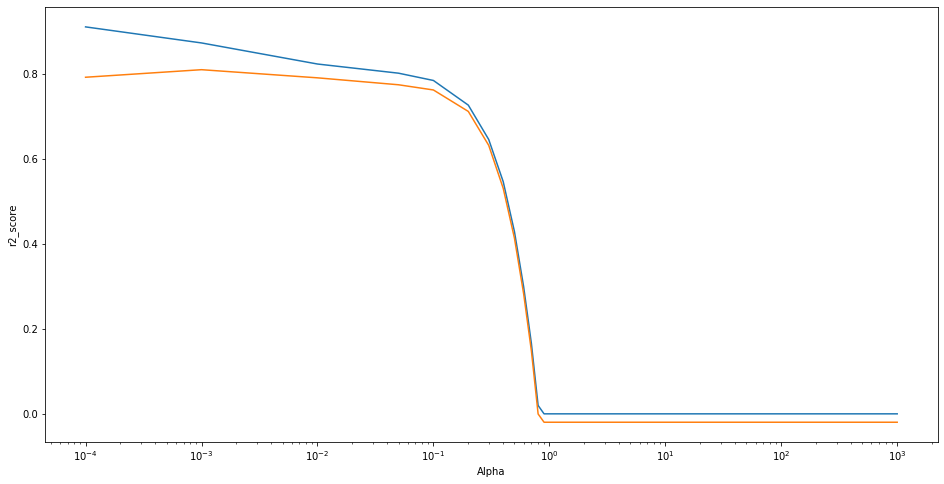

In [970]:
# plotting r2 score we got from the above step
plt.figure(figsize=(16,8))
plt.plot(cv_result_l['param_alpha'],cv_result_l['mean_train_score'])
plt.plot(cv_result_l['param_alpha'],cv_result_l['mean_test_score'])
plt.xscale('log')
plt.ylabel('r2_score')
plt.xlabel('Alpha')
plt.show()

In [971]:
cv_result_l.shape # shape of the dataframe

(28, 31)

In [972]:
model_cv.best_params_ # get the best parameter

{'alpha': 0.001}

## get the values and coeficients using optimal Lambda

In [973]:
lasso = Lasso(alpha=0.001)
lasso.fit(X_train_rfe,y_train)

y_train_pred = lasso.predict(X_train_rfe)
y_test_pred = lasso.predict(X_test_rfe)

print(r2_score(y_true=y_train,y_pred=y_train_pred))
print(r2_score(y_true=y_test,y_pred=y_test_pred))

0.8708588652221473
0.8418204702135157


In [974]:
lasso.coef_ ## get the coefficients

array([ 0.34175475, -0.12236531,  0.10651385,  0.34937219,  0.18069089,
        0.65033036,  0.5850644 ,  0.74168503,  0.45013269,  0.17790286,
        0.28294893, -0.23204628,  0.04312708,  0.17009575, -0.        ,
        0.        , -0.        , -2.72392949, -0.        ,  0.        ,
        0.391919  ,  0.        ,  0.        ,  0.54381469,  0.18891002,
        0.41946735, -0.4709049 ,  0.23901713,  0.        ,  0.04154062,
       -0.        ,  0.        , -0.13939072,  0.49562532,  0.46474231,
       -0.        , -0.        , -0.33680777,  0.10578388,  0.22069742,
        0.        , -0.        ,  0.25055489, -0.27704594,  0.        ,
       -0.        ,  0.03707967,  0.00979963,  0.21623688,  0.32820492])

In [975]:
# lasso model parameters
model_parameters = list(lm.coef_)
model_parameters.insert(0, lm.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
cols = X_train_rfe.columns
cols = cols.insert(0, "constant")
list(zip(cols, model_parameters))

[('constant', -248677760907.671),
 ('OverallQual', 0.001),
 ('YearBuilt', 0.06),
 ('BsmtFinSF1', 0.005),
 ('GrLivArea', -0.031),
 ('GarageCars', 0.158),
 ('MSZoning_FV', 0.116),
 ('MSZoning_RH', -0.139),
 ('MSZoning_RL', -0.038),
 ('MSZoning_RM', 0.004),
 ('Neighborhood_BrkSide', -0.004),
 ('Neighborhood_Crawfor', -0.008),
 ('Neighborhood_MeadowV', 0.025),
 ('Neighborhood_StoneBr', -0.002),
 ('Condition1_Norm', 0.036),
 ('Condition1_RRAe', 0.023),
 ('Condition1_RRNn', 556434663836.049),
 ('Condition2_Feedr', 0.001),
 ('Condition2_PosN', 197682443522.98),
 ('Condition2_RRAn', 540353809665.855),
 ('RoofStyle_Shed', -535106079682.33),
 ('RoofMatl_CompShg', 0.031),
 ('RoofMatl_Metal', 0.036),
 ('RoofMatl_Roll', 1795275572929.53),
 ('RoofMatl_Tar&Grv', 2035191569554.691),
 ('RoofMatl_WdShake', 227422895777.645),
 ('RoofMatl_WdShngl', -2451815136614.088),
 ('Exterior1st_BrkComm', 0.033),
 ('Exterior1st_BrkFace', -0.01),
 ('Exterior1st_CemntBd', -0.002),
 ('Exterior2nd_CmentBd', 0.007),
 ('Ex

In [976]:
lasso_coef.sort_values(by='Coef',ascending=False) # sort the coefficients

,Featuere,Coef
21,Exterior1st_BrkComm,0.968195
19,RoofMatl_WdShake,0.841667
16,RoofMatl_Metal,0.640405
20,RoofMatl_WdShngl,0.510074
3,GarageCars,0.503210
7,Neighborhood_MeadowV,0.480553
29,Heating_GasW,0.465782
38,GarageType_CarPort,0.449819
30,Electrical_FuseP,0.331538
9,Condition1_Norm,0.308957


## Ridge

## perform Ridge regression using GridSearchCV using 10 folds.

In [977]:
folds  = KFold(n_splits=10,shuffle=True,random_state=42)

hyper_param = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20 ]}

model = Ridge()

model_cv = GridSearchCV(estimator=model,
                        param_grid=hyper_param,
                        scoring='r2',
                        cv=folds,
                        verbose=1,
                        return_train_score=True)

model_cv.fit(X_train_rfe,y_train)

Fitting 10 folds for each of 24 candidates, totalling 240 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 240 out of 240 | elapsed:    2.1s finished


GridSearchCV(cv=KFold(n_splits=10, random_state=42, shuffle=True),
             error_score='raise-deprecating',
             estimator=Ridge(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=None, normalize=False, random_state=None,
                             solver='auto', tol=0.001),
             iid='warn', n_jobs=None,
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='r2', verbose=1)

In [978]:
cv_result_r = pd.DataFrame(model_cv.cv_results_)
cv_result_r['param_alpha'] = cv_result_r['param_alpha'].astype('float32')
cv_result_r.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
0,0.006910,0.003293,0.001012,0.002718,0.0001,{'alpha': 0.0001},0.871629,0.314260,0.912256,0.928741,0.425425,0.861268,0.918087,0.849340,0.895836,0.882907,0.785504,0.211303,24,0.913108,0.914319,0.909921,0.906762,0.910716,0.913776,0.908494,0.914234,0.911992,0.912883,0.911620,0.002445
1,0.003209,0.003921,0.003314,0.003894,0.0010,{'alpha': 0.001},0.871822,0.314328,0.912342,0.928746,0.429557,0.861358,0.918022,0.849336,0.895907,0.882894,0.785963,0.210598,23,0.913106,0.914319,0.909919,0.906759,0.910714,0.913774,0.908491,0.914231,0.911989,0.912881,0.911618,0.002446
2,0.008712,0.000742,0.000431,0.000740,0.0100,{'alpha': 0.01},0.873533,0.315007,0.913087,0.928661,0.467040,0.862172,0.917392,0.849262,0.896503,0.882736,0.790091,0.204396,22,0.912897,0.914316,0.909707,0.906548,0.910570,0.913569,0.908288,0.914033,0.911782,0.912681,0.911439,0.002469
3,0.005712,0.004012,0.002021,0.003437,0.0500,{'alpha': 0.05},0.878101,0.317852,0.914823,0.926952,0.576027,0.864635,0.914904,0.848475,0.897647,0.881792,0.801730,0.188506,21,0.909998,0.914244,0.906749,0.903631,0.908407,0.910711,0.905449,0.911260,0.908886,0.909890,0.908922,0.002900
4,0.008735,0.000883,0.000401,0.000491,0.1000,{'alpha': 0.1},0.880707,0.321057,0.915413,0.924596,0.644923,0.866422,0.912501,0.847210,0.897671,0.880603,0.808757,0.180169,17,0.905585,0.914044,0.902230,0.899234,0.904816,0.906332,0.901105,0.907009,0.904468,0.905610,0.905043,0.003804


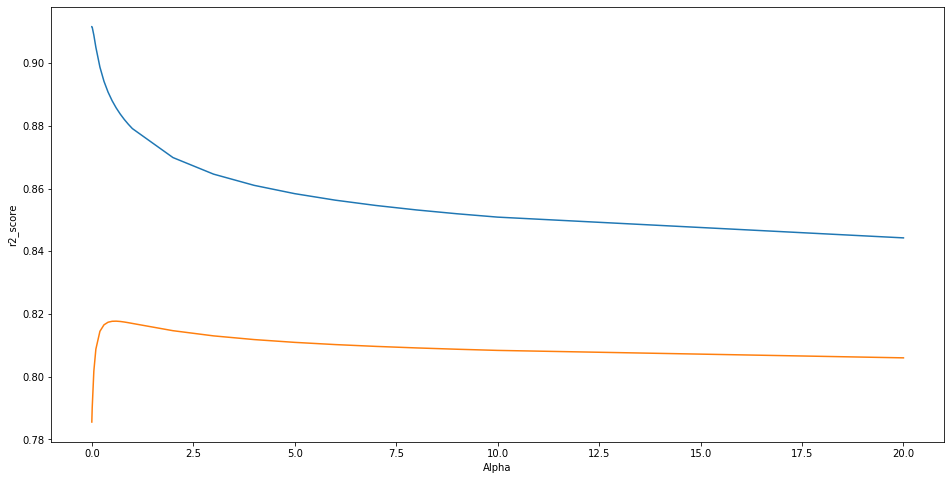

In [979]:
##plot the R2_Scores we got for train and test for Ridge
plt.figure(figsize=(16,8))
plt.plot(cv_result_r['param_alpha'],cv_result_r['mean_train_score'])
plt.plot(cv_result_r['param_alpha'],cv_result_r['mean_test_score'])
plt.xlabel('Alpha')
# plt.xscale('log')
plt.ylabel('r2_score')
plt.show()

In [980]:
model_cv.best_params_ # get the optimal hyper parameter

{'alpha': 0.6}

In [981]:
#get the R2 score for beat hyper parameter
ridge = Ridge(alpha = 0.6)
ridge.fit(X_train_rfe,y_train)

y_pred_train = ridge.predict(X_train_rfe)
print(r2_score(y_train,y_pred_train))

y_pred_test = ridge.predict(X_test_rfe)
print(r2_score(y_test,y_pred_test))

0.8849946265977674
0.8301860302300867


In [982]:
#get the coefficients
model_parameter = list(ridge.coef_)
model_parameter.insert(0,ridge.intercept_)
cols = X_train_rfe.columns
cols.insert(0,'constant')
ridge_coef = pd.DataFrame(list(zip(cols,model_parameter)))
ridge_coef.columns = ['Feaure','Coef']

In [983]:
ridge_coef.sort_values(by='Coef',ascending=False)# sort the coefficients

,Feaure,Coef
24,RoofMatl_WdShake,1.502267
26,Exterior1st_BrkComm,1.360306
21,RoofMatl_Metal,1.275566
8,MSZoning_RM,1.055516
25,RoofMatl_WdShngl,1.055424
22,RoofMatl_Roll,1.002915
6,MSZoning_RH,0.971668
7,MSZoning_RL,0.958909
9,Neighborhood_BrkSide,0.781935
35,Electrical_FuseP,0.672321


In [984]:
alpha = 0.6
ridge = Ridge(alpha=alpha)

ridge.fit(X_train_rfe, y_train)
ridge.coef_                        # display ridge coeeficients

array([ 0.3252578 , -0.12745324,  0.11159538,  0.35833105,  0.17918115,
        0.97166847,  0.95890883,  1.05551583,  0.78193505,  0.20521966,
        0.31198758, -0.33887892,  0.09826068,  0.17261474, -0.09504002,
        0.15248552, -0.20923784, -2.38217591, -0.13712297,  0.46775175,
        1.27556621,  1.0029146 ,  0.59912812,  1.50226718,  1.05542399,
        1.36030582, -0.85882661,  0.24586898, -0.11677833,  0.1884455 ,
       -0.12157923, -0.00948518, -0.40257722,  0.63040403,  0.67232141,
       -0.26693593, -0.01268709, -0.36231451,  0.30832873,  0.41238908,
        0.22896059, -0.28278288,  0.40291873, -0.38913718,  0.23694194,
        0.0232468 ,  0.41486323,  0.12548489,  0.23525435,  0.36170814])

## as we can see both the models perform same for the given data set ,Hence i owuld be choosing Lasso as it does feature elimination by maing some of the coefficients 0.

## Descriptive Questions


#### Question 1

In [985]:
ridge = Ridge(alpha = 1.2)
ridge.fit(X_train_rfe,y_train)

y_pred_train = ridge.predict(X_train_rfe)
print(r2_score(y_train,y_pred_train))

y_pred_test = ridge.predict(X_test_rfe)
print(r2_score(y_test,y_pred_test))

0.8760670819756037
0.8438951616943601


In [986]:
model_parameter = list(ridge.coef_)
model_parameter.insert(0,ridge.intercept_)
cols = house_data.columns
cols.insert(0,'constant')
ridge_coef = pd.DataFrame(list(zip(cols,model_parameter)))
ridge_coef.columns = ['Feaure','Coef']

In [987]:
ridge_coef.sort_values(by='Coef',ascending=False)

,Feaure,Coef
24,LowQualFinSF,0.933390
8,MasVnrArea,0.839569
26,BsmtFullBath,0.800117
6,YearBuilt,0.747682
21,CentralAir,0.742782
7,YearRemodAdd,0.716130
35,GarageYrBlt,0.571498
34,Fireplaces,0.570381
9,ExterQual,0.563314
25,GrLivArea,0.560461


## Lasso

In [988]:
lasso = Lasso(alpha=0.002)
lasso.fit(X_train_rfe,y_train)

y_train_pred = lasso.predict(X_train_rfe)
y_test_pred = lasso.predict(X_test_rfe)

print(r2_score(y_true=y_train,y_pred=y_train_pred))
print(r2_score(y_true=y_test,y_pred=y_test_pred))

0.8523925073704552
0.8544446906395757


In [989]:
model_param = list(lasso.coef_)
model_param.insert(0,lasso.intercept_)
cols = X_train_rfe.columns
cols.insert(0,'const')
lasso_coef = pd.DataFrame(list(zip(cols,model_param)))
lasso_coef.columns = ['Featuere','Coef']

In [990]:
lasso_coef.sort_values(by='Coef',ascending=False)

,Featuere,Coef
1,YearBuilt,0.359718
4,GarageCars,0.338057
8,MSZoning_RM,0.295916
34,Heating_GasW,0.278470
11,Neighborhood_MeadowV,0.256264
28,Exterior1st_CemntBd,0.212169
49,SaleCondition_Partial,0.208491
5,MSZoning_FV,0.182159
6,MSZoning_RH,0.180451
14,Condition1_RRAe,0.168204


## Question 3:


In [991]:
X_train_rfe = X_train_rfe.drop(['OverallQual','Condition2_RRAn','MSZoning_RM','MSZoning_RH','MSZoning_RL'],axis=1)
X_test_rfe = X_test_rfe.drop(['OverallQual','Condition2_RRAn','MSZoning_RM','MSZoning_RH','MSZoning_RL'],axis=1)

In [992]:
lasso = Lasso(alpha=0.001)
lasso.fit(X_train_rfe,y_train)

y_train_pred = lasso.predict(X_train_rfe)
y_test_pred = lasso.predict(X_test_rfe)

print(r2_score(y_true=y_train,y_pred=y_train_pred))
print(r2_score(y_true=y_test,y_pred=y_test_pred))

0.825470326503198
0.779060726083596


In [993]:
model_param = list(lasso.coef_)
model_param.insert(0,lasso.intercept_)
cols = X_train_rfe.columns
cols.insert(0,'const')
lasso_coef = pd.DataFrame(list(zip(cols,model_param)))
lasso_coef.columns = ['Featuere','Coef']

In [994]:
lasso_coef.sort_values(by='Coef',ascending=False)

,Featuere,Coef
21,Exterior1st_BrkComm,0.968195
19,RoofMatl_WdShake,0.841667
16,RoofMatl_Metal,0.640405
20,RoofMatl_WdShngl,0.510074
3,GarageCars,0.503210
7,Neighborhood_MeadowV,0.480553
29,Heating_GasW,0.465782
38,GarageType_CarPort,0.449819
30,Electrical_FuseP,0.331538
9,Condition1_Norm,0.308957
